# <center><font color = '#DF9166' size = 20 center> **Stock Price Analysis: TA-Lib & PyNance**</font></center>




## <font color = '#DF9166' size=6>**Table of content**<font/><a class = 'anchor' id = 'introduction'/>

1. [**Import Libraries**](#import)
2. [**Data Loading**](#data_loading)
3. [**Data Inspection**](#data_inspection)
4. [**Data Visualization**](#data_visualization)
4. [**Portfolio Analysis**](#portfolio_analysis)


## <font color = '#DF9166' size=6>**Import Libraries**<font/><a class = 'anchor' id = 'import'/>

In [1]:
import os
import pandas as pd
import seaborn as sns
import talib
import warnings
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import plotly.graph_objects as go
import mplfinance as mpf
from IPython.display import Image
from pynance import portfolio_optimizer as po

In [2]:
sns.set_style("whitegrid")
plt.rc("axes", titlesize=10)
plt.rc("axes", labelsize=8)
plt.rc("xtick", labelsize=8)
plt.rc("ytick", labelsize=8)
plt.rc("legend", fontsize=8)
plt.rc("figure", titlesize=12)

In [3]:
warnings.filterwarnings("ignore")

## <font color = '#DF9166' size=6>**Data Loading**<font/><a class = 'anchor' id = 'data_loading'/>

In [3]:
DATA_PATH = 'C:/dev/Side-Projects/10 Acadamy/W1 Challange/Financial-News-and-Stock-Price-Analysis/data/yfinance_data'
TICKERS = ['AAPL', 'GOOG', 'META', 'MSFT', 'AMZN', 'NVDA', 'TSLA']

In [5]:
stock_data = {}

for ticker in TICKERS:
    file_name = f"{ticker}_historical_data.csv"
    file_path = os.path.join(DATA_PATH, file_name)
    stock_data[ticker] = pd.read_csv(file_path)

In [6]:
stock_data['AAPL'].head(1)

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
0,1980-12-12,0.128348,0.128906,0.128348,0.128348,0.098943,469033600,0.0,0.0


In [7]:
stock_data['GOOG'].head(1)

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
0,2004-08-19,2.490664,2.591785,2.390042,2.499133,2.496292,897427216,0.0,0.0


In [8]:
stock_data['META'].head(1)

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
0,2012-12-12,28.0,28.139999,27.370001,27.58,27.523441,46704200,0.0,0.0


In [9]:
stock_data['MSFT'].head(1)

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
0,1986-03-13,0.088542,0.101563,0.088542,0.097222,0.059946,1031788800,0.0,0.0


In [10]:
stock_data['AMZN'].head(1)

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
0,1997-05-15,0.121875,0.125,0.096354,0.097917,0.097917,1443120000,0.0,0.0


In [11]:
stock_data['NVDA'].head(1)

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
0,1999-01-22,0.04375,0.048828,0.038802,0.041016,0.037621,2714688000,0.0,0.0


In [12]:
stock_data['TSLA'].head(1)

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
0,2010-06-29,1.266667,1.666667,1.169333,1.592667,1.592667,281494500,0.0,0.0


## <font color = '#DF9166' size=6>**Data Inspection**<font/><a class = 'anchor' id = 'data_inspection'/>

In [13]:
for ticker, data in stock_data.items():
    print(f"Shape for {ticker}: {data.shape}")

Shape for AAPL: (10998, 9)
Shape for GOOG: (5020, 9)
Shape for META: (2926, 9)
Shape for MSFT: (9672, 9)
Shape for AMZN: (6846, 9)
Shape for NVDA: (6421, 9)
Shape for TSLA: (3545, 9)


In [14]:
for ticker, data in stock_data.items():
    print(f"Columns for {ticker}: {data.columns.tolist()}")

Columns for AAPL: ['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'Dividends', 'Stock Splits']
Columns for GOOG: ['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'Dividends', 'Stock Splits']
Columns for META: ['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'Dividends', 'Stock Splits']
Columns for MSFT: ['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'Dividends', 'Stock Splits']
Columns for AMZN: ['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'Dividends', 'Stock Splits']
Columns for NVDA: ['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'Dividends', 'Stock Splits']
Columns for TSLA: ['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'Dividends', 'Stock Splits']


The following are the key columns found in the stock data for each company:

1. **Open**: The stock price at the beginning of the trading day.

2. **High**: The highest price the stock reached during the day.

3. **Low**: The lowest price the stock dropped to during the day.

4. **Close**: The price of the stock when the market closed on that day.

5. **Adj Close**: The closing price adjusted for events like dividends or stock splits, providing a more accurate view of the stock's value over time.

6. **Volume**: The total number of shares traded during the day.

7. **Dividends**: The money paid to shareholders for owning the stock (if any) on that day.

8. **Stock Splits**: A change in the number of shares available, usually making each share worth less but keeping the total value the same (if any).


In [15]:
for ticker, data in stock_data.items():
    start_date = data['Date'].min()
    end_date = data['Date'].max()
    print(f"Stock: {ticker}, Start Date: {start_date}, End Date: {end_date}")

Stock: AAPL, Start Date: 1980-12-12, End Date: 2024-07-30
Stock: GOOG, Start Date: 2004-08-19, End Date: 2024-07-30
Stock: META, Start Date: 2012-12-12, End Date: 2024-07-30
Stock: MSFT, Start Date: 1986-03-13, End Date: 2024-07-30
Stock: AMZN, Start Date: 1997-05-15, End Date: 2024-07-30
Stock: NVDA, Start Date: 1999-01-22, End Date: 2024-07-30
Stock: TSLA, Start Date: 2010-06-29, End Date: 2024-07-30


In [16]:
for ticker, data in stock_data.items():
    print(f"Info for {ticker}:")
    print(data.info(), "\n")

Info for AAPL:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10998 entries, 0 to 10997
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          10998 non-null  object 
 1   Open          10998 non-null  float64
 2   High          10998 non-null  float64
 3   Low           10998 non-null  float64
 4   Close         10998 non-null  float64
 5   Adj Close     10998 non-null  float64
 6   Volume        10998 non-null  int64  
 7   Dividends     10998 non-null  float64
 8   Stock Splits  10998 non-null  float64
dtypes: float64(7), int64(1), object(1)
memory usage: 773.4+ KB
None 

Info for GOOG:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5020 entries, 0 to 5019
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          5020 non-null   object 
 1   Open          5020 non-null   float64
 2   High          5020 non-null   float

In [17]:
# Check for missing data
for ticker, data in stock_data.items():
    print(f"Missing values in {ticker}: {data.isna().sum().sum()}")

    if data.isna().sum().sum() > 0:
        data.dropna(inplace=True)

Missing values in AAPL: 0
Missing values in GOOG: 0
Missing values in META: 0
Missing values in MSFT: 0
Missing values in AMZN: 0
Missing values in NVDA: 0
Missing values in TSLA: 0


### Descriptive Statistics

In [18]:
stock_data['AAPL'].describe()

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
count,10998.000000,10998.000000,10998.000000,10998.000000,10998.000000,1.099800e+04,10998.000000,10998.000000
mean,22.299160,22.539055,22.068367,22.312754,21.494496,3.180806e+08,0.000752,0.001546
std,46.003685,46.496031,45.540929,46.037660,45.561916,3.354523e+08,0.011753,0.083663
min,0.049665,0.049665,0.049107,0.049107,0.037857,0.000000e+00,0.000000,0.000000
25%,0.299107,0.303710,0.290179,0.298549,0.241840,1.132545e+08,0.000000,0.000000
50%,0.531250,0.537946,0.522321,0.531250,0.432079,2.057412e+08,0.000000,0.000000
75%,20.204196,20.389554,19.998036,20.196160,17.253029,3.985275e+08,0.000000,0.000000
max,236.479996,237.229996,233.089996,234.820007,234.548523,7.421641e+09,0.250000,7.000000


In [19]:
stock_data['GOOG'].describe()

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
count,5020.000000,5020.000000,5020.000000,5020.000000,5020.000000,5.020000e+03,5020.000000,5020.000000
mean,45.251315,45.728793,44.800587,45.274515,45.224493,1.157539e+08,0.000040,0.004583
std,43.338635,43.818298,42.918167,43.377299,43.332534,1.497936e+08,0.002823,0.284034
min,2.470490,2.534002,2.390042,2.490913,2.488082,1.584340e+05,0.000000,0.000000
25%,13.034705,13.145415,12.881592,13.032090,13.017277,2.733950e+07,0.000000,0.000000
50%,26.982210,27.194902,26.791387,27.005927,26.975230,5.585480e+07,0.000000,0.000000
75%,60.215126,60.758375,59.811811,60.280252,60.211734,1.425333e+08,0.000000,0.000000
max,191.750000,193.309998,190.619995,192.660004,192.660004,1.650833e+09,0.200000,20.000000


In [20]:
stock_data['META'].describe()

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
count,2926.000000,2926.000000,2926.000000,2926.000000,2926.000000,2.926000e+03,2926.000000,2926.0
mean,179.557215,181.875331,177.317761,179.649453,179.305921,2.872083e+07,0.000342,0.0
std,108.864895,110.256219,107.511134,108.906971,108.755055,2.269811e+07,0.013070,0.0
min,22.990000,23.090000,22.670000,22.900000,22.853037,5.467500e+06,0.000000,0.0
25%,97.767502,98.772499,95.889997,97.382498,97.182795,1.571308e+07,0.000000,0.0
50%,166.870003,168.850006,164.210007,166.855003,166.512825,2.176100e+07,0.000000,0.0
75%,231.450005,234.934998,228.687504,232.424999,231.948360,3.294468e+07,0.000000,0.0
max,542.349976,542.809998,528.359985,539.909973,539.909973,3.654579e+08,0.500000,0.0


In [21]:
stock_data['MSFT'].describe()

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
count,9672.000000,9672.000000,9672.000000,9672.000000,9672.000000,9.672000e+03,9672.000000,9672.000000
mean,58.402199,59.003071,57.784759,58.417683,52.719365,5.677678e+07,0.002982,0.001758
std,90.122302,90.958645,89.232546,90.146786,90.066461,3.814123e+07,0.046524,0.057944
min,0.088542,0.092014,0.088542,0.090278,0.055665,2.304000e+06,0.000000,0.000000
25%,5.695313,5.770508,5.617188,5.695313,3.511695,3.206982e+07,0.000000,0.000000
50%,27.304999,27.600000,27.085000,27.341875,19.145540,4.990225e+07,0.000000,0.000000
75%,46.687500,47.099998,46.138672,46.657187,38.339042,7.071788e+07,0.000000,0.000000
max,467.000000,468.350006,464.459991,467.559998,466.718781,1.031789e+09,3.080000,2.000000


In [22]:
stock_data['AMZN'].describe()

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
count,6846.000000,6846.000000,6846.000000,6846.000000,6846.000000,6.846000e+03,6846.0,6846.000000
mean,37.360464,37.801009,36.882561,37.351096,37.351096,1.380713e+08,0.0,0.003944
std,53.756955,54.366449,53.087051,53.729913,53.729913,1.382346e+08,0.0,0.246789
min,0.070313,0.072396,0.065625,0.069792,0.069792,9.744000e+06,0.0,0.000000
25%,2.070125,2.120625,2.040156,2.076750,2.076750,6.505442e+07,0.0,0.000000
50%,8.574500,8.666750,8.466500,8.591500,8.591500,1.020650e+08,0.0,0.000000
75%,50.453876,50.723249,50.059875,50.426500,50.426500,1.567560e+08,0.0,0.000000
max,200.089996,201.199997,199.050003,200.000000,200.000000,2.086584e+09,0.0,20.000000


In [23]:
stock_data['NVDA'].describe()

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
count,6421.000000,6421.000000,6421.000000,6421.000000,6421.000000,6.421000e+03,6421.000000,6421.000000
mean,6.207884,6.320466,6.085095,6.207702,6.181334,6.060791e+08,0.000025,0.003348
std,16.138328,16.424862,15.794914,16.118517,16.121352,4.323482e+08,0.000316,0.142397
min,0.034896,0.035547,0.033333,0.034115,0.031291,1.968000e+07,0.000000,0.000000
25%,0.277500,0.286250,0.269500,0.276750,0.253843,3.456350e+08,0.000000,0.000000
50%,0.457250,0.464750,0.450750,0.457000,0.427637,5.070000e+08,0.000000,0.000000
75%,4.182500,4.235750,4.116500,4.175000,4.130434,7.362000e+08,0.000000,0.000000
max,139.800003,140.759995,132.419998,135.580002,135.580002,9.230856e+09,0.010000,10.000000


In [24]:
stock_data['TSLA'].describe()

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
count,3545.000000,3545.000000,3545.000000,3545.000000,3545.000000,3.545000e+03,3545.0,3545.000000
mean,75.505658,77.159237,73.743492,75.487264,75.487264,9.699708e+07,0.0,0.002257
std,102.530489,104.806516,100.051787,102.456615,102.456615,7.866828e+07,0.0,0.097921
min,1.076000,1.108667,0.998667,1.053333,1.053333,1.777500e+06,0.0,0.000000
25%,11.516667,11.861333,11.216667,11.565333,11.565333,4.770600e+07,0.0,0.000000
50%,17.463333,17.688667,17.100000,17.459333,17.459333,8.250600e+07,0.0,0.000000
75%,161.880005,165.333328,158.360001,161.479996,161.479996,1.228890e+08,0.0,0.000000
max,411.470001,414.496674,405.666656,409.970001,409.970001,9.140820e+08,0.0,5.000000


## <font color = '#DF9166' size=6>**Data Visualization**<font/><a class = 'anchor' id = 'data_visualization'/>

### Candlestick Visualization

In [25]:
def plot_candlestick(df, title, ticker, start_date=None, end_date=None):
    """Function to plot a candlestick chart for stock data with annotations."""

    # Use min and max dates from the dataframe if no start_date or end_date are provided
    if start_date is None:
        start_date = df["Date"].min()
    if end_date is None:
        end_date = df["Date"].max()

    # Filter the DataFrame based on the provided or default date range
    df_filtered = df[(df["Date"] >= start_date) & (df["Date"] <= end_date)]

    # Create the candlestick chart
    fig = go.Figure(
        data=[
            go.Candlestick(
                x=df_filtered["Date"],
                open=df_filtered["Open"],
                high=df_filtered["High"],
                low=df_filtered["Low"],
                close=df_filtered["Close"],
            )
        ]
    )

    # Add layout configuration
    fig.update_layout(
        title=dict(text=title),
        yaxis=dict(title=dict(text=f"{ticker} Stock")),
        shapes=[
            dict(
                x0=start_date,
                x1=start_date,
                y0=0,
                y1=1,
                xref="x",
                yref="paper",
                line_width=2,
            )
        ],
        annotations=[
            dict(
                x=start_date,
                y=0.05,
                xref="x",
                yref="paper",
                showarrow=False,
                xanchor="left",
                text=f"Period Start: {start_date}",
            )
        ],
    )
    fig.show()

In [26]:
plot_candlestick(stock_data['AAPL'], 'AAPL Stock Price', ticker='AAPL')

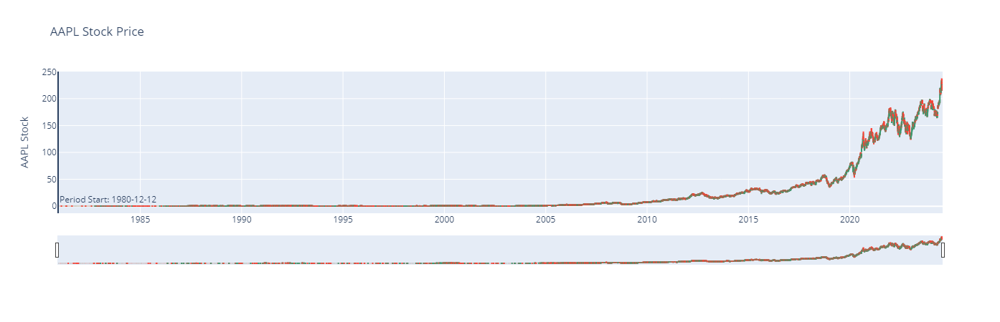

In [27]:
Image('C:/dev/Side-Projects/10 Acadamy/W1 Challange/Financial-News-and-Stock-Price-Analysis/assets/task-2/candlestick-AAPL.png')

In [28]:
plot_candlestick(stock_data['GOOG'], 'GOOG Stock Price', ticker='GOOG')

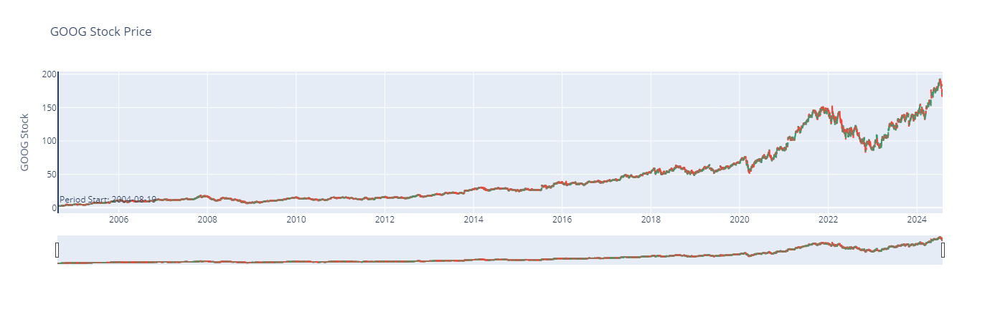

In [29]:
Image('C:/dev/Side-Projects/10 Acadamy/W1 Challange/Financial-News-and-Stock-Price-Analysis/assets/task-2/candlestick-GOOG.png')

In [30]:
plot_candlestick(stock_data['META'], 'META Stock Price', ticker='META')

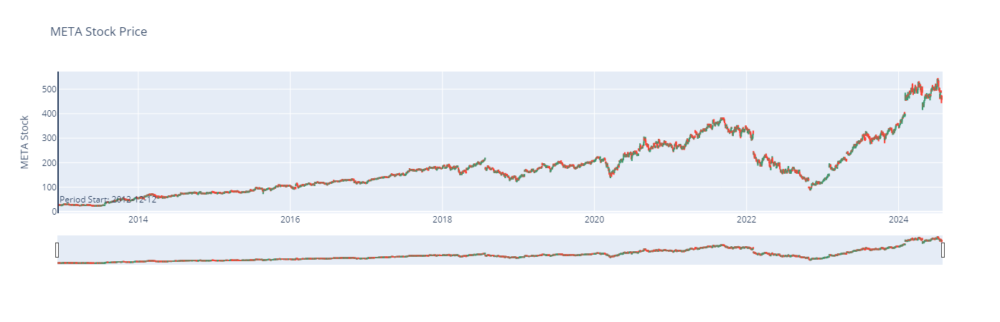

In [31]:
Image('C:/dev/Side-Projects/10 Acadamy/W1 Challange/Financial-News-and-Stock-Price-Analysis/assets/task-2/candlestick-META.png')

In [32]:
plot_candlestick(stock_data['MSFT'], 'MSFT Stock Price', ticker='MSFT')

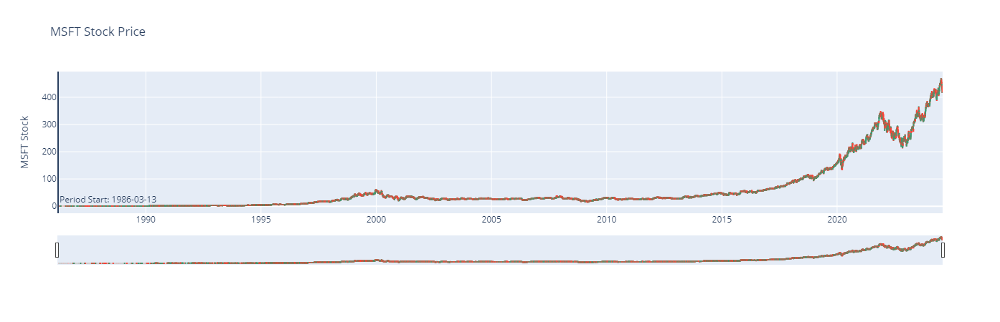

In [33]:
Image('C:/dev/Side-Projects/10 Acadamy/W1 Challange/Financial-News-and-Stock-Price-Analysis/assets/task-2/candlestick-MSFT.png')

In [34]:
plot_candlestick(stock_data['AMZN'], 'AMZN Stock Price', ticker='AMZN')

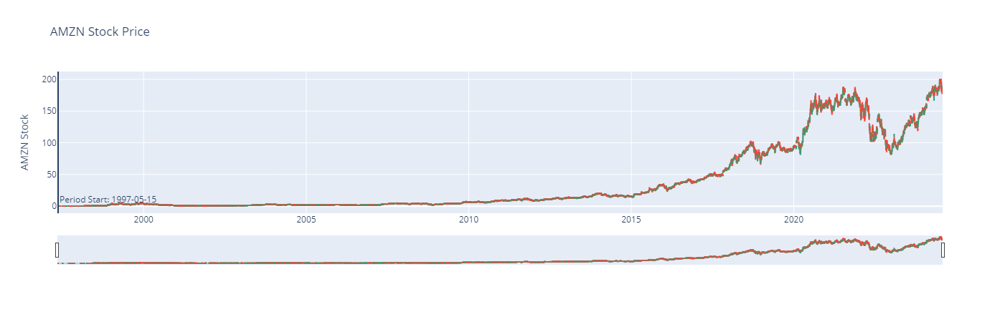

In [35]:
Image('C:/dev/Side-Projects/10 Acadamy/W1 Challange/Financial-News-and-Stock-Price-Analysis/assets/task-2/candlestick-AMZN.png')

In [36]:
plot_candlestick(stock_data['NVDA'], 'NVDA Stock Price', ticker='NVDA')

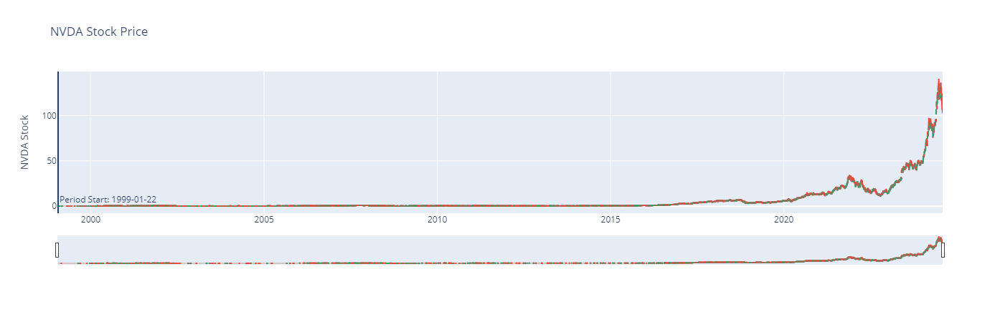

In [37]:
Image('C:/dev/Side-Projects/10 Acadamy/W1 Challange/Financial-News-and-Stock-Price-Analysis/assets/task-2/candlestick-NVDA.png')

In [38]:
plot_candlestick(stock_data['TSLA'], 'TSLA Stock Price', ticker='TSLA')

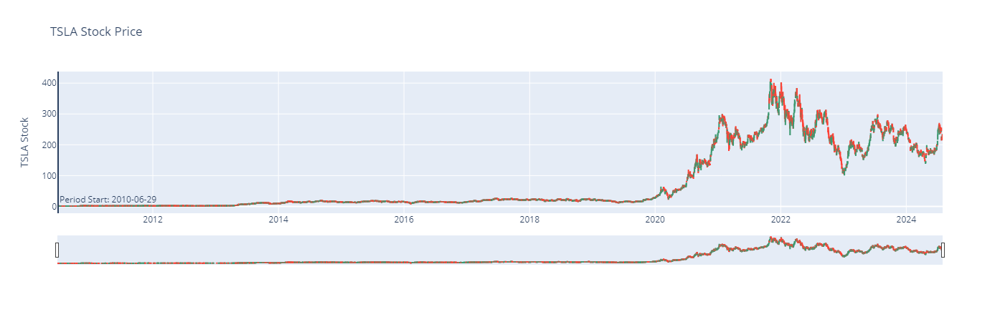

In [39]:
Image('C:/dev/Side-Projects/10 Acadamy/W1 Challange/Financial-News-and-Stock-Price-Analysis/assets/task-2/candlestick-TSLA.png')

In [57]:
TICKERS

['AAPL', 'GOOG', 'META', 'MSFT', 'AMZN', 'NVDA', 'TSLA']

In [60]:
# Ensure the 'Date' column is in datetime format and set it as the index
for ticker in TICKERS:
    try:
        stock_data[ticker]['Date'] = pd.to_datetime(stock_data[ticker]['Date'])
        stock_data[ticker] = stock_data[ticker].set_index('Date')
    except:
        pass


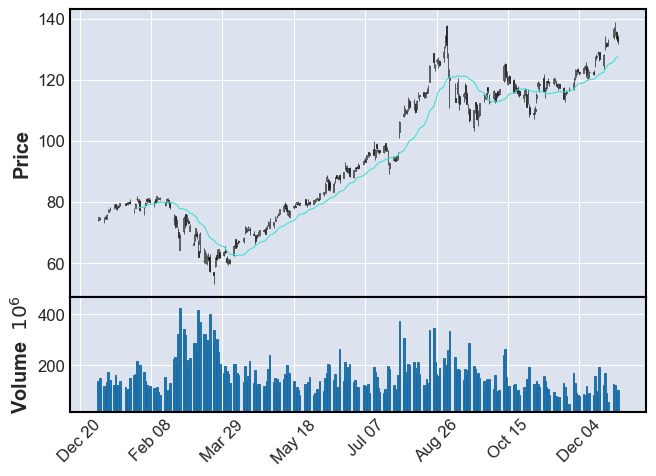

In [61]:
# Define the start and end dates for one year
start_date = '2020-01-01'
end_date = '2020-12-31'

# Filter the data for the specified date range
data_one_year = stock_data['AAPL'].loc[start_date:end_date]

# Plot with a 20-day moving average
mpf.plot(data_one_year, type='candle', mav=20, volume=True, show_nontrading=True)


### Technical Indicators Visualization

In [42]:
def plot_close_and_moving_averages(ax, df, start=None, end=None, title="Close Price and Moving Averages"):
    """Calculate and plot Close Price and Moving Averages on the provided axis."""
    if start is None:
        start = df.index.min()
    if end is None:
        end = df.index.max()
    df = df.loc[start:end]

    df['SMA20'] = talib.SMA(df['Close'], timeperiod=20)
    df['EMA'] = talib.EMA(df['Close'], timeperiod=20)
    ax.plot(df['Close'], label='Close Price', color='black', linewidth=0.5)
    ax.plot(df['SMA20'], label='SMA20', color='blue', linewidth=0.5)
    ax.plot(df['EMA'], label='EMA', color='red', linewidth=0.5)
    ax.set_title(title)
    ax.set_ylabel('Price')
    ax.legend()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%Y'))
    ax.grid(False)
    ax.set_facecolor("#f5f5f5")

In [43]:
def plot_rsi(ax, df, start=None, end=None, title="Relative Strength Index (RSI)"):
    """Calculate and plot RSI on the provided axis."""
    if start is None:
        start = df.index.min()
    if end is None:
        end = df.index.max()
    df = df.loc[start:end]

    df['RSI'] = talib.RSI(df['Close'], timeperiod=14)
    ax.plot(df['RSI'], label='RSI', color='green', linewidth=0.5)
    ax.axhline(70, color='red', linestyle='--', label='Overbought (70)', linewidth=0.5)
    ax.axhline(30, color='red', linestyle='--', label='Oversold (30)', linewidth=0.5)
    ax.set_title(title)
    ax.set_ylabel('RSI')
    ax.legend()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%Y'))
    ax.grid(False)
    ax.set_facecolor("#f5f5f5")

In [44]:
def plot_macd(ax, df, start=None, end=None, title="MACD Indicator"):
    """Calculate and plot MACD Indicator on the provided axis."""
    if start is None:
        start = df.index.min()
    if end is None:
        end = df.index.max()
    df = df.loc[start:end]

    macd, macdsignal, macdhist = talib.MACD(df['Close'], fastperiod=12, slowperiod=26, signalperiod=9)
    df['MACD'] = macd
    df['MACD_Signal'] = macdsignal
    df['MACD_Hist'] = macdhist
    ax.plot(df['MACD'], label='MACD', color='blue', linewidth=0.5)
    ax.plot(df['MACD_Signal'], label='MACD Signal', color='red', linewidth=0.5)
    ax.bar(df.index, df['MACD_Hist'], label='MACD Histogram', color='grey', alpha=0.5, width=1)
    ax.set_title(title)
    ax.set_ylabel('MACD')
    ax.legend()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%Y'))
    ax.grid(False)
    ax.set_facecolor("#f5f5f5")

In [45]:
def plot_volatility(ax, df, start=None, end=None, title="Volatility"):
    """Calculate and plot Close Price and Volatility on the provided axis."""
    if start is None:
        start = df.index.min()
    if end is None:
        end = df.index.max()
    df = df.loc[start:end]

    df['Return'] = df['Close'].pct_change()
    df['Volatility'] = df['Return'].rolling(window=21).std()
    ax.plot(df['Close'], label='Close Price', color='black', linewidth=0.5)
    ax.plot(df['Volatility'], label='Volatility', color='blue', linewidth=0.5)
    ax.set_title(title)
    ax.set_ylabel('Volatility')
    ax.legend()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%Y'))
    ax.grid(False)
    ax.set_facecolor("#f5f5f5")


In [49]:

def plot_stock_indicators(df, start=None, end=None, title="Stock Analysis: Close Price, RSI, MACD, and Volatility"):
    """Wrapper function to plot all stock indicators for a given dataframe."""
    plt.figure(figsize=(14, 15))
    fig, axs = plt.subplots(4, 1, figsize=(14, 15))

    # Add a suptitle to the plots
    fig.suptitle(title, fontsize=14)

    # Plot each indicator
    plot_close_and_moving_averages(axs[0], df, start=start, end=end, title="Close Price and Moving Averages")
    plot_rsi(axs[1], df, start=start, end=end, title="Relative Strength Index (RSI)")
    plot_macd(axs[2], df, start=start, end=end, title="MACD Indicator")
    plot_volatility(axs[3], df, start=start, end=end, title="Volatility")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to accommodate suptitle
    plt.show()

<Figure size 1400x1500 with 0 Axes>

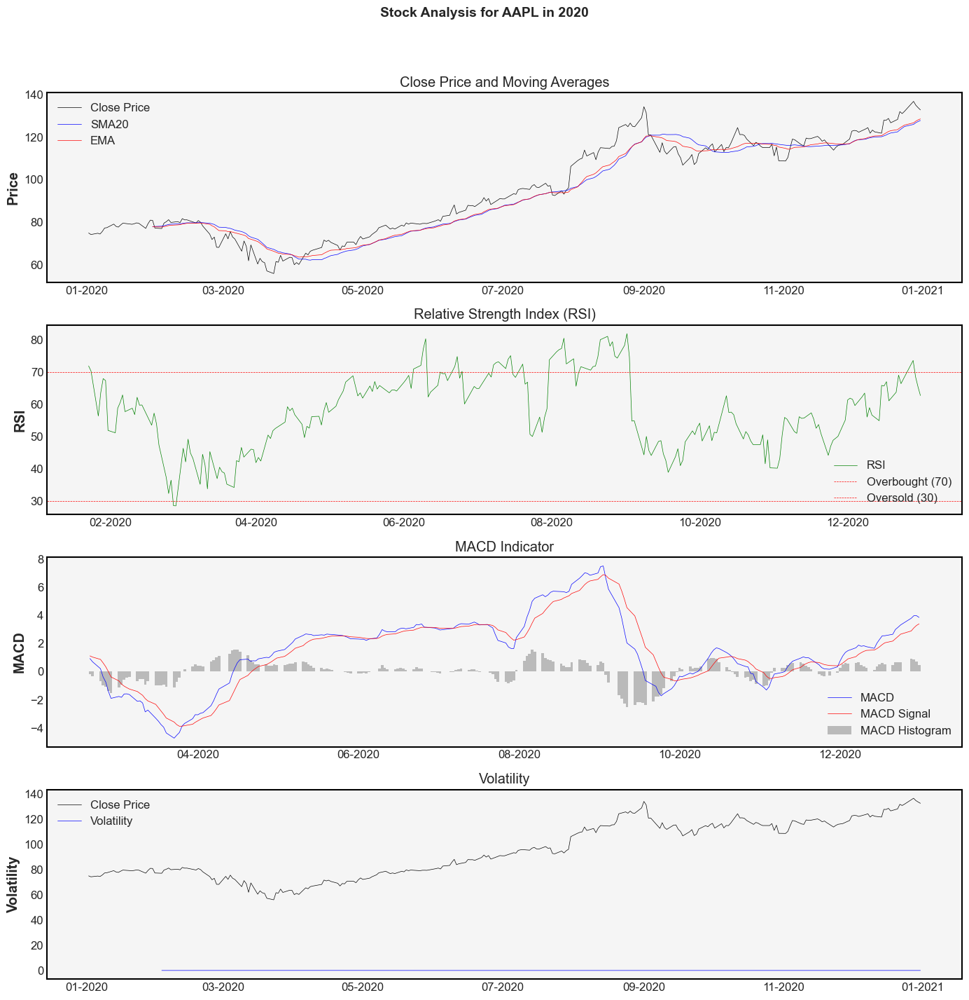

In [50]:
df_2020 = stock_data['AAPL'].loc['2020-01-01':'2020-12-31']
plot_stock_indicators(df_2020, title="Stock Analysis for AAPL in 2020")

<Figure size 1400x1500 with 0 Axes>

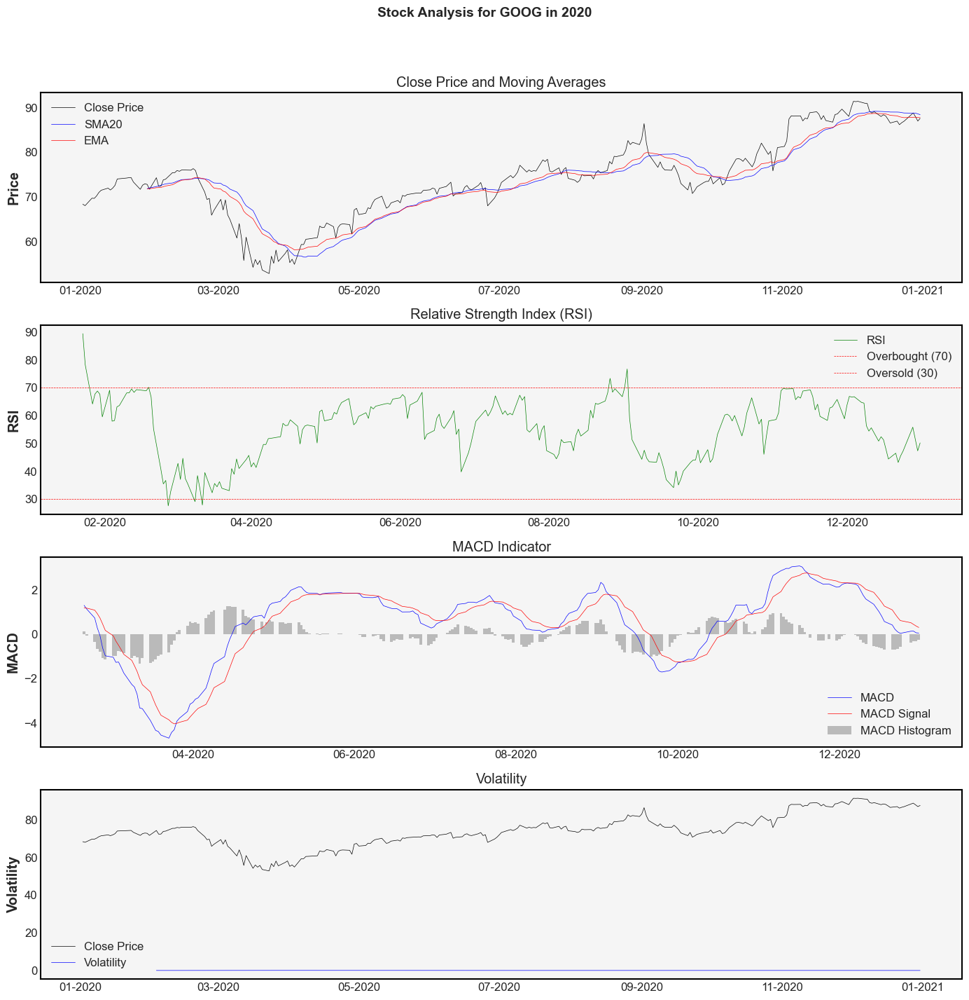

In [ ]:
df_2020 = stock_data['GOOG'].loc['2019-01-01':'2019-12-31']
plot_stock_indicators(df_2020, title="Stock Analysis for GOOG in 2020")

<Figure size 1400x1500 with 0 Axes>

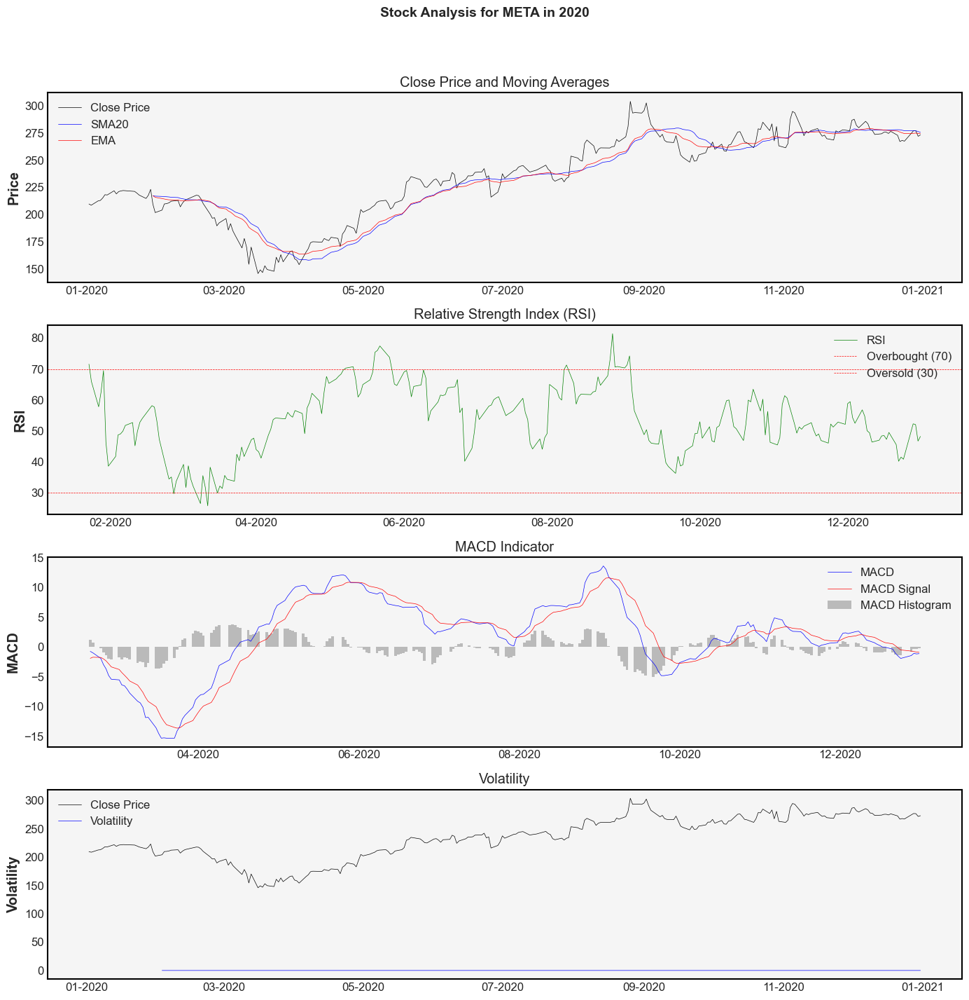

In [ ]:
df_2020 = stock_data['META'].loc['2020-01-01':'2020-12-31']
plot_stock_indicators(df_2020, title="Stock Analysis for META in 2020")

<Figure size 1400x1500 with 0 Axes>

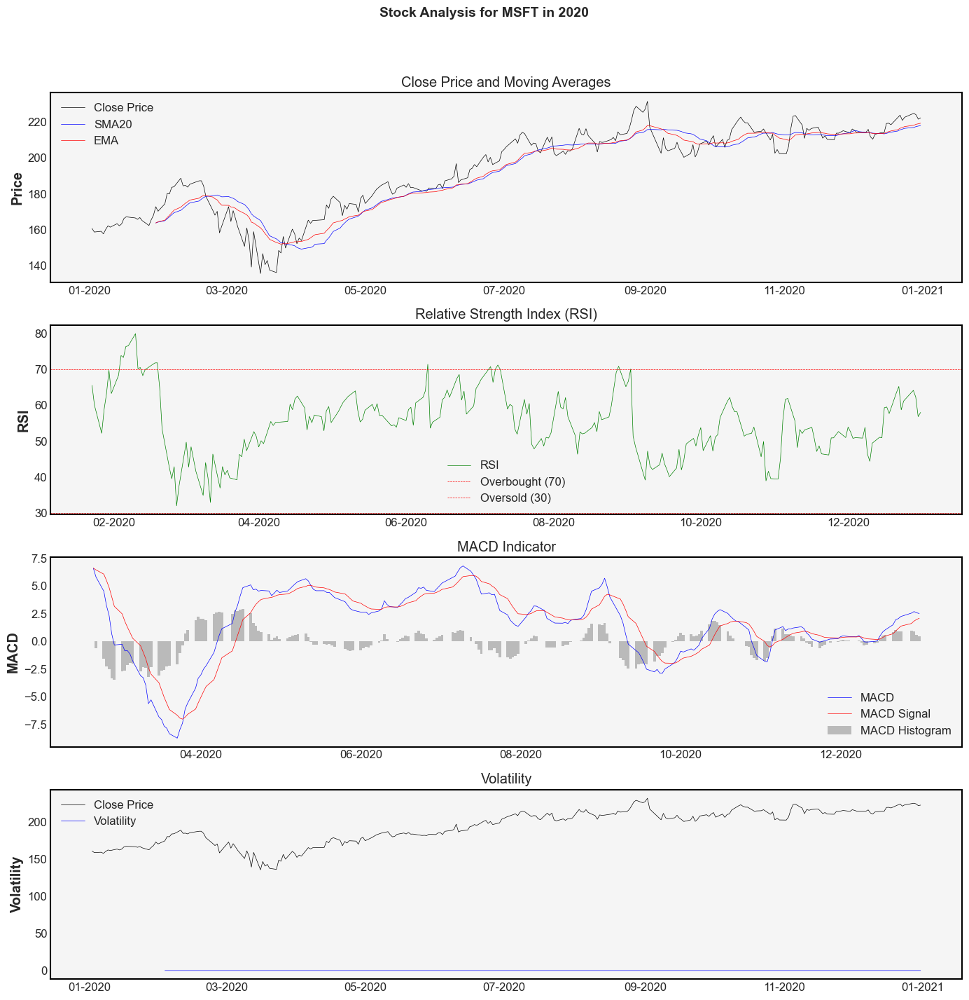

In [62]:
df_2020 = stock_data['MSFT'].loc['2020-01-01':'2020-12-31']
plot_stock_indicators(df_2020, title="Stock Analysis for MSFT in 2020")

<Figure size 1400x1500 with 0 Axes>

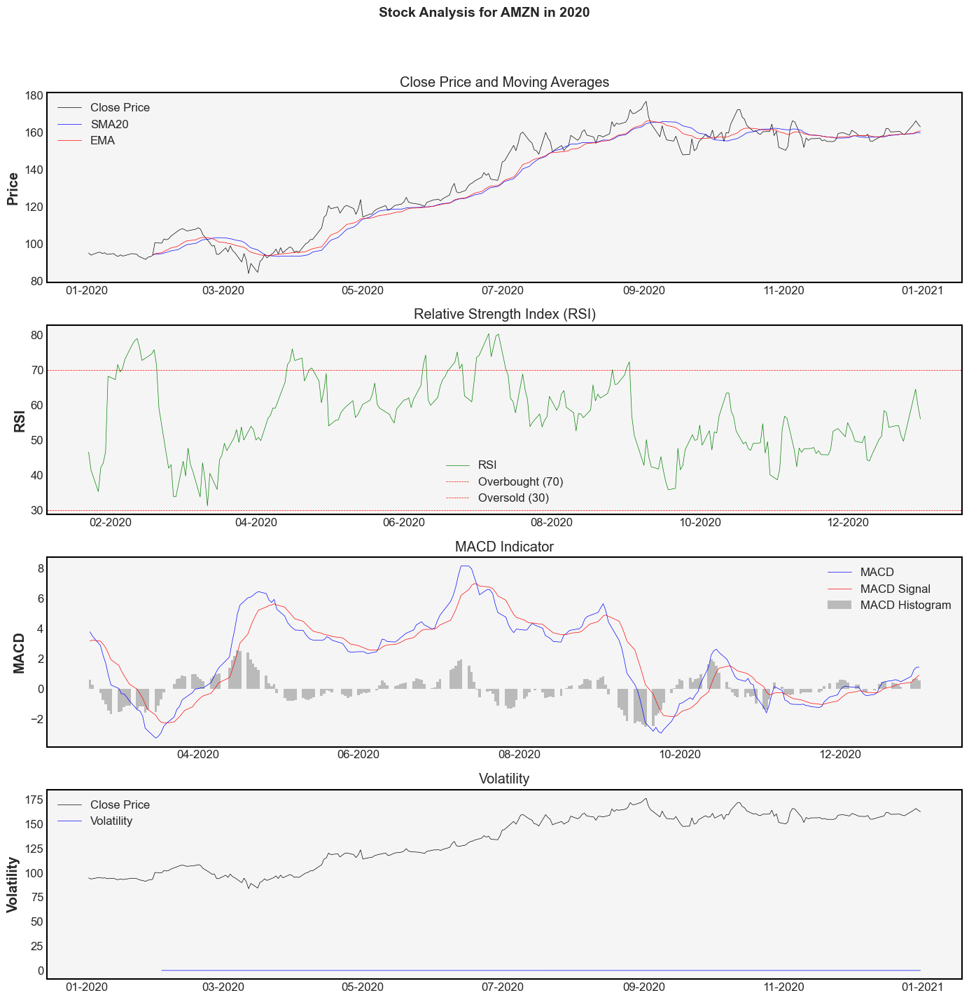

In [63]:
df_2020 = stock_data['AMZN'].loc['2020-01-01':'2020-12-31']
plot_stock_indicators(df_2020, title="Stock Analysis for AMZN in 2020")

<Figure size 1400x1500 with 0 Axes>

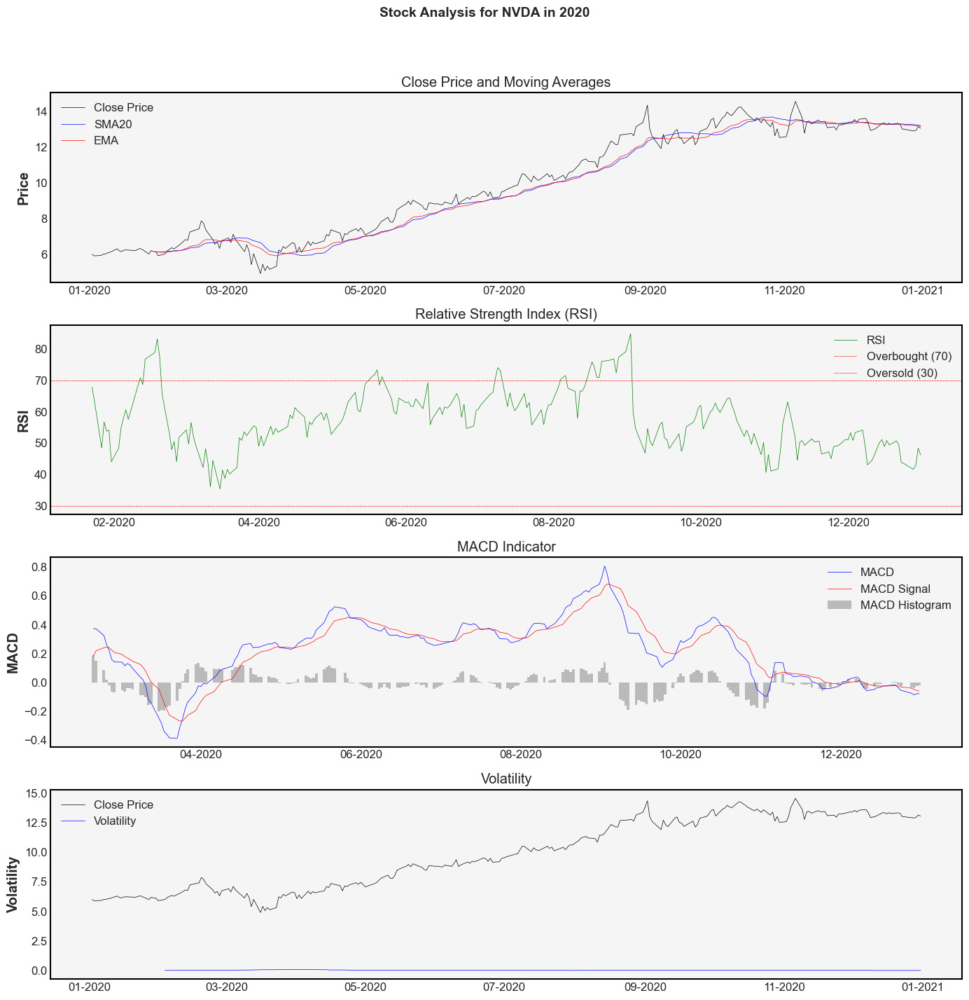

In [64]:
df_2020 = stock_data['NVDA'].loc['2020-01-01':'2020-12-31']
plot_stock_indicators(df_2020, title="Stock Analysis for NVDA in 2020")

<Figure size 1400x1500 with 0 Axes>

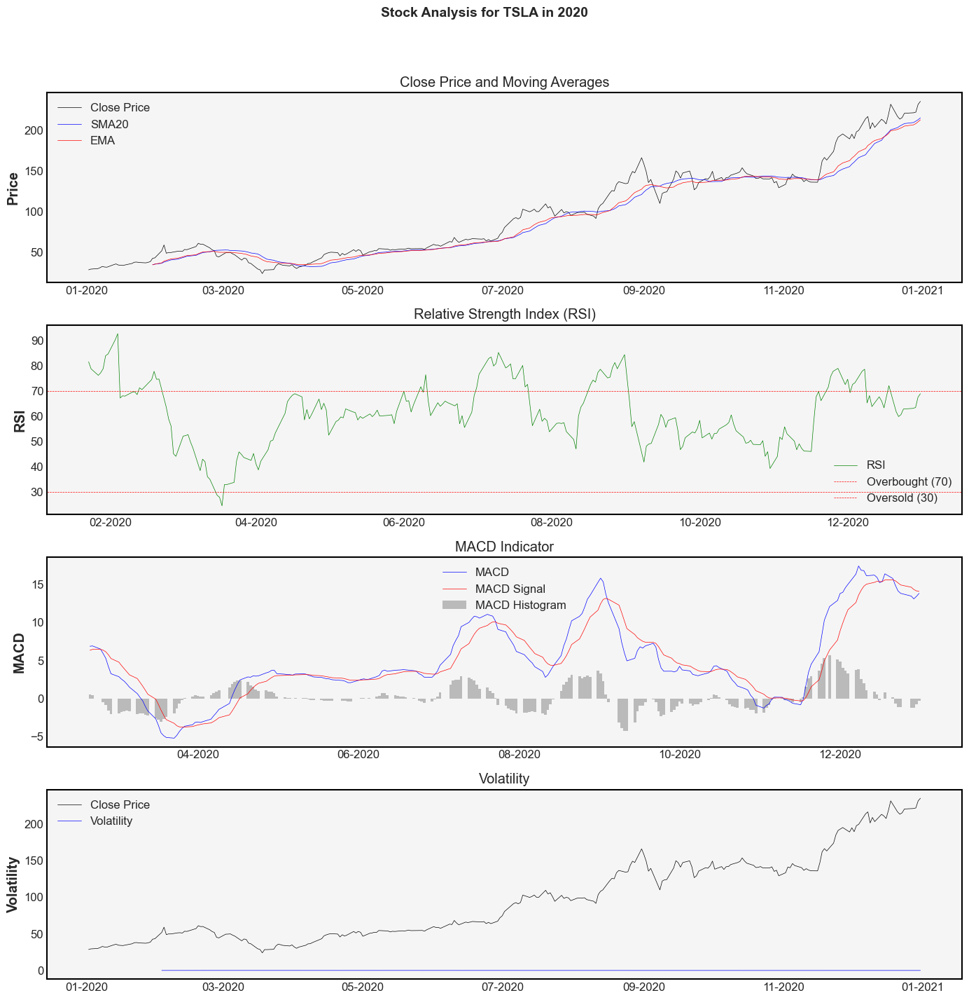

In [65]:

df_2020 = stock_data['TSLA'].loc['2020-01-01':'2020-12-31']
plot_stock_indicators(df_2020, title="Stock Analysis for TSLA in 2020")

## <font color = '#DF9166' size=6>**Portfolio Analysis**<font/><a class = 'anchor' id = 'portfolio_analysis'/>

**Portfolio optimization** refers to the process of selecting the best portfolio (a mix of assets) to achieve a particular objective, such as maximizing return or minimizing risk, based on constraints like capital and risk tolerance.

Some of the key terms in finance include:

- **Sharpe Ratio**: A risk-adjusted performance metric that measures the excess return per unit of risk (standard deviation). The goal is to maximize the Sharpe ratio for optimal portfolio performance.

In [21]:
def max_sharpe_portfolio(ticker_list):
    """Optimizes the portfolio for maximum Sharpe ratio and returns expected return and standard deviation."""
    portfolio = po.PortfolioCalculations(ticker_list)
    risk_return = portfolio.max_sharpe_portfolio('rr')
    return risk_return

def max_sharpe_weights(ticker_list):
    """Returns the portfolio weights for the maximum Sharpe ratio portfolio."""
    portfolio = po.PortfolioCalculations(ticker_list)
    max_sharpe_df = portfolio.max_sharpe_portfolio('df')
    return max_sharpe_df

def min_var_portfolio(ticker_list):
    """Optimizes the portfolio for minimum variance and returns expected return and standard deviation."""
    portfolio = po.PortfolioCalculations(ticker_list)
    risk_return = portfolio.min_var_portfolio('rr')
    return risk_return

def min_var_weights(ticker_list):
    """Returns the portfolio weights for the minimum variance portfolio."""
    portfolio = po.PortfolioCalculations(ticker_list)
    min_var_df = portfolio.min_var_portfolio('df')
    return min_var_df

def efficient_frontier(ticker_list):
    """Returns a plot of the efficient frontier for the given ticker list."""
    portfolio = po.PortfolioCalculations(ticker_list)
    fig = portfolio.efficient_frontier()
    fig.show()

def expected_return_range(ticker_list):
    """Returns a plot of expected return range with continuous error bars for portfolios."""
    portfolio = po.PortfolioCalculations(ticker_list)
    fig = portfolio.expected_return_range()
    fig.show()

def capital_allocation(ticker_list, portfolio_ID):
    """Returns the capital allocation for the given portfolio ID."""
    portfolio = po.PortfolioCalculations(ticker_list)
    portfolio_allocation = portfolio.capital_allocation(portfolio_ID)
    return portfolio_allocation

In [7]:
# Max Sharpe Portfolio
max_sharpe_result = max_sharpe_portfolio(TICKERS)
print(max_sharpe_result)

                   Max Sharpe Portfolio
Expected Return                 109.99%
Standard Deviation               48.39%


The Max Sharpe Portfolio has an expected return of 109.99%, meaning it could more than double the investment, but with a standard deviation of 48.39%, indicating high volatility and significant risk. It provides the best balance between return and risk (highest Sharpe ratio).

In [8]:
# Max Sharpe Weights
max_sharpe_weights_result = max_sharpe_weights(TICKERS)
print(max_sharpe_weights_result)

     Portfolio Weight
AAPL            0.00%
GOOG            0.00%
META            0.00%
MSFT            0.00%
AMZN            0.00%
NVDA           82.60%
TSLA           17.40%


The portfolio is highly concentrated in NVIDIA (82.60%) and Tesla (17.40%), with no allocation to other stocks. This suggests the optimization favors these two for the best risk-return balance but increases risk due to lack of diversification.

In [9]:
# Min Variance Portfolio
min_var_result = min_var_portfolio(TICKERS)
print(min_var_result)

                   Min Var Portfolio
Expected Return               26.94%
Standard Deviation            21.95%


The Min Variance Portfolio aims to minimize risk (volatility) while still providing returns. It has an expected return of 26.94% with a standard deviation of 21.95%, indicating a lower-risk portfolio optimized to minimize volatility while still achieving moderate returns. It is ideal for risk-averse investors prioritizing stability over higher returns.

In [10]:
# Min Variance Weights
min_var_weights_result = min_var_weights(TICKERS)
print(min_var_weights_result)

     Portfolio Weight
AAPL            8.47%
GOOG           20.10%
META            0.00%
MSFT           71.43%
AMZN            0.00%
NVDA            0.00%
TSLA            0.00%


The Min Variance Portfolio is heavily weighted in Microsoft (MSFT) with 71.43%, followed by Google (GOOG) at 20.10%, and Apple (AAPL) at 8.47%. There is no allocation to META, AMZN, NVDA, or TSLA. This suggests that the portfolio is optimized to minimize risk by concentrating on a few stable stocks, with a preference for Microsoft.

In [26]:
# Efficient Frontier Plot
efficient_frontier(TICKERS)

    Expected Return  Standard Deviation          AAPL          GOOG  \
0            0.2493              0.3328  3.221517e-18  1.491304e-18   
1            0.2507              0.3214  1.554312e-15  7.216450e-16   
2            0.2522              0.2970  1.026956e-15  0.000000e+00   
3            0.2537              0.2751  3.053113e-16  1.137979e-15   
4            0.2552              0.2562  0.000000e+00  0.000000e+00   
5            0.2566              0.2412  0.000000e+00  1.387779e-17   
6            0.2581              0.2307  0.000000e+00  0.000000e+00   
7            0.2596              0.2253  0.000000e+00  8.072577e-03   
8            0.2611              0.2226  1.595657e-17  7.234111e-02   
9            0.2626              0.2207  0.000000e+00  1.384534e-01   
10           0.2641              0.2201  8.652806e-03  1.920316e-01   
11           0.2656              0.2198  3.009757e-02  1.930749e-01   
12           0.2670              0.2196  5.124885e-02  1.953234e-01   
13    

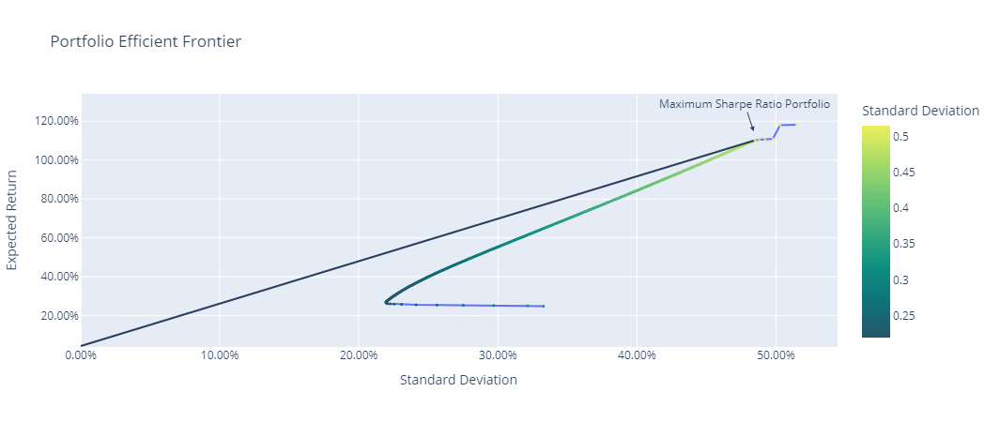

In [24]:
Image('C:/dev/Side-Projects/10 Acadamy/W1 Challange/Financial-News-and-Stock-Price-Analysis/assets/task-2/efficient-frontier.png')

In [20]:
# Expected Return Range Plot
expected_return_range(TICKERS)

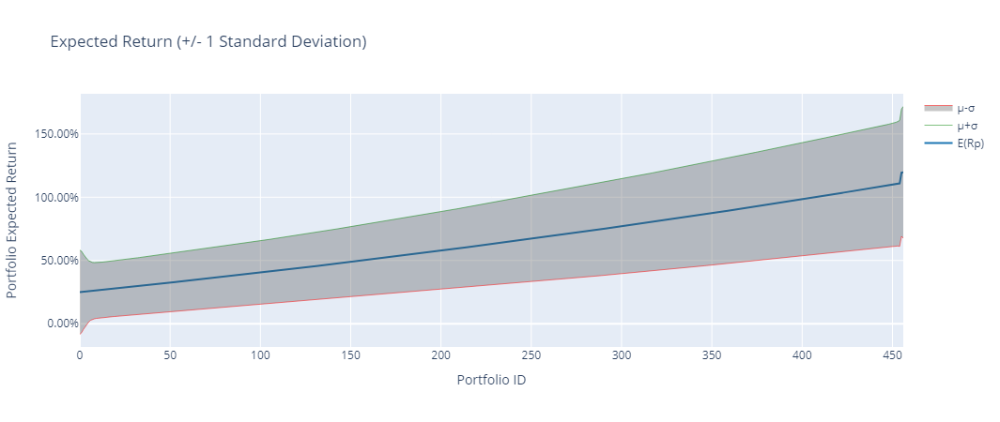

In [25]:
Image('C:/dev/Side-Projects/10 Acadamy/W1 Challange/Financial-News-and-Stock-Price-Analysis/assets/task-2/expected-return.png')

The plot shows the range of expected returns for various portfolios, with error bars indicating the variability (or uncertainty) of those returns. It shows how much the expected return might vary based on portfolio allocation and the inherent volatility in the market.

In [23]:
# Capital Allocation for a Portfolio ID
portfolio_ID = 56  # Example Portfolio ID
capital_allocation_result = capital_allocation(TICKERS, portfolio_ID)
print(capital_allocation_result)


     Portfolio Weight
AAPL           14.90%
GOOG           19.18%
META            0.04%
MSFT           57.04%
AMZN            0.00%
NVDA            8.83%
TSLA            0.00%
